# Exericse 7-1: Particle on a Spheroid Earth

This program shows the paths of particles on a spheroidal earth. The lefthand sphere is rotating in absolute space, the right hand sphere is shown in a rotating reference frame, rotating with angular velocity w. 

Code translated from GW-BASIC provided in Exercise 7.1 of Stommel and Moore (1989)

author: Victoria McDonald
email: vmcd@atmos.washington.edu
website: https://github.com/torimcd/coriolis-sm

In [3]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.animation import FuncAnimation
import numpy as np
from IPython.display import HTML
%matplotlib inline

Here we set values for the starting latitude and components of the velocity. In the original GW-BASIC, the program prompts the user to enter values each time they rerun the program. Here you are encouraged to download the notebook or code file and experiment with different values on your own.

In [4]:
latitude = 45
(u, v) = 0,2

NOTE: python is zero based so the particles are stored as 0,1,2,3 instead of 1,2,3,4
For ease of reading along with the book, only the particle with index 4 has changed:
index 1 has been kept as the expert in absolute space,
index 2 has been kept as the novice in absolute space
index 3 has been kept as the expert in  moving reference frame
index 4 has been moved to index 0 - the novice in the moving reference frame

Here we set up the global variables and initialize the objects containing the particles. Note that in the following code blocks, expert refers to a particle that is moving with the same angular velocity as the rotating spheroid. Novice refers to the particle that is moving with a different velocity than the rotation of the earth.

In [7]:
pi = np.pi    # pi
w = 10        # rotation rate of the earth (angular velocity) (m/s) right hand sphere
w2 = w**2     # the bulge of the sphereoid - set to zero for a perfect sphere
dt = 0.005    # time step
fact = 60     # scale of the display
inc = pi/16   # inclination of the spheres  
lat = {}      # latitude
lon = {}      # longitude
dlat = {}     # time derivative of latitude
dlon = {}     # time derivative of longitude
ddlat = {}    # acceleration in latitude
ddlon = {}    # acceleration in longitude
rho = {}
x = {}
y = {}
z = {}
c = {}        # colors for plotting
t = 0         # initial time is zero 

# set initial values for latitude and longitude
for i in range(4):
    lat[i] = latitude*pi/180
    lon[i] = -pi/2

# set initial values for derivatives
dlat[1] = 0
dlat[3] = 0
dlat[2] = v
dlat[0] = dlat[2]

# set u component velocities in absolute reference frame
dlon[2] = u/np.cos(lat[1]) + w
dlon[0] = dlon[2]

Here we set up the figure, creating two spheres of radius 60. In the text it is mentioned that the bulge of the spheroid is too small to be detected, so we plot them as spheres with equal aspect ratio. The movement of the particles does take into account the bulge. Setting w2 = 0 in the constants above removes the effect of the bulge on the particle's motion.

Text(0.5, 1.0, 'Relative')

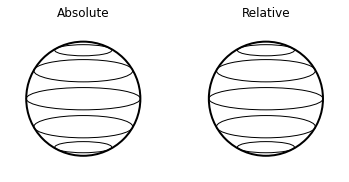

In [17]:
fig = plt.figure()

# -------- Create the sphere in the absolute reference frame
ax_fixed = fig.add_subplot(121, aspect='auto')

# create oblate spheroids out of ellipse patches for outline and lats
fixed_outline = patches.Ellipse((0,0), 120, 120, 0, linewidth=2, fill=False)
fixed_center_lat = patches.Ellipse((0,0), 120, 120*np.sin(inc), 0, linewidth=1, fill=False)

c9 = 60*np.sin(pi/6)*np.cos(inc)
c8 = 60*np.sin(pi/3)*np.cos(inc)

fixed_mid_lat_up = patches.Ellipse((0,0+c9), 120*np.cos(pi/6), 120*np.sin(inc), 0, linewidth=1, fill=False)
fixed_mid_lat_down = patches.Ellipse((0,0-c9), 120*np.cos(pi/6), 120*np.sin(inc), 0, linewidth=1, fill=False)
fixed_pole_lat_up = patches.Ellipse((0,0+c8), 120*np.cos(pi/3), 60*np.sin(inc), 0, linewidth=1, fill=False)
fixed_pole_lat_down = patches.Ellipse((0,0-c8), 120*np.cos(pi/3), 60*np.sin(inc), 0, linewidth=1, fill=False)

# add the ellipses to the plot
ax_fixed.add_patch(fixed_outline)
ax_fixed.add_patch(fixed_center_lat)
ax_fixed.add_patch(fixed_mid_lat_up)
ax_fixed.add_patch(fixed_mid_lat_down)
ax_fixed.add_patch(fixed_pole_lat_up)
ax_fixed.add_patch(fixed_pole_lat_down)
ax_fixed.set_aspect('equal')

# Turn off axes
plt.axis('off')

ax_fixed.set_xlim((-80, 80))
ax_fixed.set_ylim((-80, 80))

ax_fixed.set_title("Absolute")
# --------

# -------- Create the sphere in the rotating reference frame
ax_rot = fig.add_subplot(122, aspect='auto')

# create ellipse patches for the outline and lats
rot_outline = patches.Ellipse((0,0), 120, 120, 0, linewidth=2, fill=False) # sphere outline
rot_center_lat = patches.Ellipse((0,0), 120, 120*np.sin(inc), 0, linewidth=1, fill=False) # center lat ellipse

rot_mid_lat_up = patches.Ellipse((0,0+c9), 120*np.cos(pi/6), 120*np.sin(inc), 0, linewidth=1, fill=False) # mid lat ellipses
rot_mid_lat_down = patches.Ellipse((0,0-c9), 120*np.cos(pi/6), 120*np.sin(inc), 0, linewidth=1, fill=False)
rot_pole_lat_up = patches.Ellipse((0,0+c8), 120*np.cos(pi/3), 60*np.sin(inc), 0, linewidth=1, fill=False) # pole lat ellipses
rot_pole_lat_down = patches.Ellipse((0,0-c8), 120*np.cos(pi/3), 60*np.sin(inc), 0, linewidth=1, fill=False)

# add the ellipses to the plot
ax_rot.add_patch(rot_outline)
ax_rot.add_patch(rot_center_lat)
ax_rot.add_patch(rot_mid_lat_up)
ax_rot.add_patch(rot_mid_lat_down)
ax_rot.add_patch(rot_pole_lat_up)
ax_rot.add_patch(rot_pole_lat_down)

ax_rot.set_aspect('equal')

# Turn off axes
plt.axis('off')

ax_rot.set_xlim((-80, 80))
ax_rot.set_ylim((-80, 80))

ax_rot.set_title("Relative")
# --------


Set up the four particles with empty data that will be filled during each step of the animation

In [18]:
# set up the four particles
fixed_expert = ax_fixed.plot([], [], marker='o', ms=3, label='Expert')[0]
fixed_novice = ax_fixed.plot([], [], marker='o', ms=2, label='Novice')[0]
rotating_expert = ax_rot.plot([], [], marker='o', ms=3)[0]
rotating_novice = ax_rot.plot([], [], marker='o', ms=2)[0]

# ------ Set up legend 
ax_fixed.annotate('Expert: ', (-75, -70), color='k', weight='bold', fontsize=8)
ax_fixed.annotate('Novice: ', (-75, -80), color='k', weight='bold', fontsize=8)

ax_fixed.plot(-33, -65, color='red', marker='o', ms=3)
ax_fixed.plot(-33, -76, color='gold', marker='o', ms=2)

ax_fixed.annotate('On back, expert: ', (45, -70), color='k', weight='bold', fontsize=8)
ax_fixed.annotate('               novice: ', (45, -80), color='k', weight='bold', fontsize=8)

ax_rot.plot(-65, -65, color='green', marker='o', ms=3)
ax_rot.plot(-65, -76, color='limegreen', marker='o', ms=2)

The is the function that updates the particles' positions

In [19]:
def update(frame):
    # mark all variables as global to pull in their previous values
    global lat
    global lon
    global dlat
    global dlon
    global ddlat
    global ddlon
    global rho
    global x
    global y
    global z
    global t
    global u
    global v
    global w
    global w2
    global dt
    global fact

    # integration in absolute frame
    ddlon[2] = 2*np.tan(lat[2])*dlat[2]*dlon[2]

    aaa = np.sin(lat[2])*np.cos(lat[2])
    bbb = (w2 - (dlon[2])**2)

    ddlat[2] = aaa*bbb

    dlon[2] = dlon[2] + dt*ddlon[2]
    dlat[2] = dlat[2] + dt*ddlat[2]

    t = t+dt

    lat[2] = lat[2] + dt*dlat[2]
    lon[2] = lon[2] + dt*dlon[2]

    lon[0] = lon[2] - w*t

    # integration in relative frame 
    lat[0] = lat[2]
    lon[1] = lon[1] + w*dt

    # convert to x, y coordinates
    for i in range(4):
        rho[i] = np.cos(lat[i])
        x[i] = rho[i]*np.cos(lon[i])
        y[i] = rho[i]*np.sin(lon[i])*np.sin(inc)
        z[i] = y[i] + np.sin(lat[i])*np.cos(inc)

    # set the color of the particle based on its position - change to green when it's around the back of the sphere
    if y[2] < 0:
        c[1] = 'red'
    else:
        c[1] = 'green'

    if y[2] < 0:
        c[2] = 'gold'
    else:
        c[2] = 'limegreen'

    if y[3] < 0:
        c[3] = 'red'
    else:
        c[3] = 'green'

    if y[0] < 0:
        c[0] = 'gold'
    else:
        c[0] = 'limegreen'


    # update the plot
    fixed_expert.set_data(fact*x[1], fact*z[1])
    fixed_expert.set_color(c[1])

    fixed_novice.set_data(fact*x[2], fact*z[2])
    fixed_novice.set_color(c[2])

    rotating_expert.set_data(fact*x[3], fact*z[3])
    rotating_expert.set_color(c[3])
    
    rotating_novice.set_data(fact*x[0], fact*z[0])
    rotating_novice.set_color(c[0])

    return [fixed_expert, fixed_novice, rotating_expert, rotating_novice]

This controls the animation, using the update function, and then converts the animation to a javascript widget so it can be viewed in a notebook.

In [20]:
animation = FuncAnimation(fig, update, frames=500, interval=50, repeat=False, blit=False)

HTML(animation.to_jshtml())